# Modeling Cross Section Data with KNN

In [ ]:
# Prototype
import sys
# This allows us to import the nucml utilities
sys.path.append("../..")

In [1]:
import pandas as pd
import os

import nucml.exfor.data_utilities as exfor_utils 
import nucml.datasets as nuc_data 
import nucml.model.utilities as model_utils

## Loading Training Results

In [19]:
results_b0 = pd.read_csv("knn_results_B0.csv").sort_values(by="id")
results_b1 = pd.read_csv("knn_results_B1.csv").sort_values(by="id")
results_b2 = pd.read_csv("knn_results_B2.csv").sort_values(by="id")
results_b3 = pd.read_csv("knn_results_B3.csv").sort_values(by="id")
results_b4 = pd.read_csv("knn_results_B4.csv").sort_values(by="id")

In [20]:
results_b0["scale_energy"] = results_b0.run_name.apply(lambda x: True if "v2" in x else False)
results_b0["Model"] = results_b0.model_path.apply(lambda x: os.path.basename(os.path.dirname(x)))

In [21]:
results_b0 = results_b0[results_b0.normalizer == "minmax"]
results_b0 = results_b0[results_b0.scale_energy == True]
results_b0 = results_b0[results_b0.distance_metric == 'manhattan']

## Loading Best Models

In [25]:
# best_b0 = model_utils.get_best_models_df(results_b0, keep_first=True)
best_b1 = model_utils.get_best_models_df(results_b1, keep_first=True)
best_b2 = model_utils.get_best_models_df(results_b2, keep_first=True)
best_b3 = model_utils.get_best_models_df(results_b3, keep_first=True)
best_b4 = model_utils.get_best_models_df(results_b4, keep_first=True)

In [26]:
# b0_train_model, b0_train_scaler = model_utils.load_model_and_scaler(best_b0.iloc[[0]])
b1_train_model, b1_train_scaler = model_utils.load_model_and_scaler(best_b1.iloc[[0]])
b2_train_model, b2_train_scaler = model_utils.load_model_and_scaler(best_b2.iloc[[0]])
b3_train_model, b3_train_scaler = model_utils.load_model_and_scaler(best_b3.iloc[[0]])
b4_train_model, b4_train_scaler = model_utils.load_model_and_scaler(best_b4.iloc[[0]])

In [27]:
b1_val_model, b1_val_scaler = model_utils.load_model_and_scaler(best_b1.iloc[[1]])
b2_val_model, b2_val_scaler = model_utils.load_model_and_scaler(best_b2.iloc[[1]])
b3_val_model, b3_val_scaler = model_utils.load_model_and_scaler(best_b3.iloc[[1]])
b4_val_model, b4_val_scaler = model_utils.load_model_and_scaler(best_b4.iloc[[1]])

## Loading EXFOR Data

In [33]:
df_b1, _, _, _, _, to_scale_b1, _ = nuc_data.load_exfor(pedro=True, basic=1)
df_b2, _, _, _, _, to_scale_b2, _ = nuc_data.load_exfor(pedro=True, basic=2)
df_b3, _, _, _, _, to_scale_b3, _ = nuc_data.load_exfor(pedro=True, basic=3)
df_b4, _, _, _, _, to_scale_b4, _ = nuc_data.load_exfor(pedro=True, basic=4)

INFO:root: MODE: neutrons
INFO:root: LOW ENERGY: True
INFO:root: LOG: True
INFO:root: BASIC: 3
INFO:root:Reading data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/EXFOR/CSV_Files\EXFOR_neutrons\EXFOR_neutrons_MF3_AME_no_RawNaN.csv
INFO:root:Data read into dataframe with shape: (4184115, 24)
INFO:root:Splitting dataset into training and testing...
INFO:root:Normalizing dataset...
INFO:root:Fitting new scaler.


## Chlorine

In [34]:
new_cl_data_kwargs = {"Z":17, "A":35, "MT":103, "log":True, "scale":True, "one_hot":True}
# new_cl_data_b0 = exfor_utils.load_newdata("../../EXFOR/New_Data/Chlorine_Data/new_cl_np.csv", df_b0, scaler=b0_train_scaler, **new_cl_data_kwargs)
new_cl_data_b1 = exfor_utils.load_newdata("../../EXFOR/New_Data/Chlorine_Data/new_cl_np.csv", df_b1, 
                                          scaler=b1_train_scaler, to_scale=to_scale_b1, **new_cl_data_kwargs)
new_cl_data_b2 = exfor_utils.load_newdata("../../EXFOR/New_Data/Chlorine_Data/new_cl_np.csv", df_b2, 
                                          scaler=b2_train_scaler, to_scale=to_scale_b2, **new_cl_data_kwargs)
new_cl_data_b3 = exfor_utils.load_newdata("../../EXFOR/New_Data/Chlorine_Data/new_cl_np.csv", df_b3, 
                                          scaler=b3_train_scaler, to_scale=to_scale_b3, **new_cl_data_kwargs)
new_cl_data_b4 = exfor_utils.load_newdata("../../EXFOR/New_Data/Chlorine_Data/new_cl_np.csv", df_b4, 
                                          scaler=b4_train_scaler, to_scale=to_scale_b4, **new_cl_data_kwargs)

INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (12, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 50)
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (12, 50)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 61)
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (12, 61)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 108)
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (12, 108)


In [36]:
def plot_chlorine(df, model, to_scale, scaler, new_data, tag):
    new_cl = exfor_utils.predicting_nuclear_xs_v2(
        df, 17, 35, 103, model, to_scale, scaler, show=False, save=True, 
        path="figures/Cl/{}_cl35_np.png".format(tag), get_endf=True, 
        log=True, new_data=new_data, save_both=True)

def plot_chlorine_val(df, model, to_scale, scaler, new_data, tag):
    new_cl = exfor_utils.predicting_nuclear_xs_v2(
        df, 17, 35, 103, model, to_scale, scaler, show=False, save=True, 
        path="figures/Cl/{}_cl35_np_val.png".format(tag), get_endf=True, 
        log=True, new_data=new_data, save_both=True)
    
for df, model, to_scale, scaler, new_data, tag in zip([df_b1, df_b2, df_b3, df_b4], 
                                    [b1_train_model, b2_train_model, b3_train_model, b4_train_model], 
                                    [to_scale_b1, to_scale_b2, to_scale_b3, to_scale_b4],
                                    [b1_train_scaler, b2_train_scaler, b3_train_scaler, b4_train_scaler],
                                    [new_cl_data_b1, new_cl_data_b2, new_cl_data_b3, new_cl_data_b4], 
                                    ['b1', 'b2', 'b3', 'b4']):
    plot_chlorine(df, model, to_scale, scaler, new_data, tag)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 50)
INFO:root:Extracting samples from datafra

In [39]:
for df, model, to_scale, scaler, new_data, tag in zip([df_b1, df_b2, df_b3, df_b4], 
                                    [b1_val_model, b2_val_model, b3_val_model, b4_val_model], 
                                    [to_scale_b1, to_scale_b2, to_scale_b3, to_scale_b4],
                                    [b1_val_scaler, b2_val_scaler, b3_val_scaler, b4_val_scaler],
                                    [new_cl_data_b1, new_cl_data_b2, new_cl_data_b3, new_cl_data_b4], 
                                    ['b1', 'b2', 'b3', 'b4']):
    plot_chlorine_val(df, model, to_scale, scaler, new_data, tag)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 50)
INFO:root:Extracting samples from datafra

In [41]:
cl_b2 = exfor_utils.predicting_nuclear_xs_v2(
        df_b2, 17, 35, 103, b2_train_model, to_scale_b2, b2_train_scaler, show=False, save=False, 
        path="figures/Cl/{}_cl35_np.png".format(tag), get_endf=True, 
        log=True, new_data=new_cl_data_b2, save_both=False)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 50)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (215, 50)


In [44]:
for_latex = pd.DataFrame(columns=["Energy", "Data", "DT"])
for_latex["Energy"] = 10**new_cl_data_b2.Energy.values
for_latex["Data"] = 10**new_cl_data_b2.Data.values
for_latex["KNN"] = 10**b2_train_model.predict(new_cl_data_b2.drop(columns=["Data"]))

In [47]:
print(for_latex.to_latex(index=False))

\begin{tabular}{rrlr}
\toprule
   Energy &   Data &  DT &      KNN \\
\midrule
2420000.0 & 0.0166 & NaN & 0.040723 \\
2420000.0 & 0.0196 & NaN & 0.040723 \\
2520000.0 & 0.0261 & NaN & 0.045894 \\
2520000.0 & 0.0257 & NaN & 0.045894 \\
2580000.0 & 0.0446 & NaN & 0.054121 \\
2580000.0 & 0.0417 & NaN & 0.054121 \\
2640000.0 & 0.0500 & NaN & 0.059396 \\
2640000.0 & 0.0478 & NaN & 0.059396 \\
2740000.0 & 0.0284 & NaN & 0.064900 \\
2740000.0 & 0.0281 & NaN & 0.064900 \\
2740000.0 & 0.0315 & NaN & 0.064900 \\
2740000.0 & 0.0324 & NaN & 0.064900 \\
\bottomrule
\end{tabular}



In [46]:
import sklearn.metrics as metrics

print(metrics.median_absolute_error(for_latex.Data, for_latex.KNN))

0.020658571809797632


## Carbon

In [69]:
c_b0 = exfor_utils.predicting_nuclear_xs_v2(
    df_b0, 6, 12, 1, b0_train_model, to_scale_b0, b0_train_scaler, show=True, save=True, 
    path="Figures/KNN/B0_c12_nt.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/C012/endfb8.0/tables/xs/n-C012-MT001.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 1338 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (23448, 40)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (23448, 40)


In [126]:
cc_b1 = exfor_utils.predicting_nuclear_xs_v2(
    df_b1, 6, 12, 102, b1_train_model, to_scale_b1, b1_train_scaler, show=True, save=False, 
    path="Figures/KNN/B1_c12_nt.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/C012/endfb8.0/tables/xs/n-C012-MT102.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 327 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (33, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (33, 43)


## Chlorine

In [202]:
cl_b1 = exfor_utils.predicting_nuclear_xs_v2(
    df_b1, 17, 35, 103, b1_train_model, to_scale_b1, b1_train_scaler, show=True, save=True, 
    path="Figures/KNN/B1_cl35_np.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)


## Uranium Predictions

In [15]:
order_dict=  {"endf":3, "exfor_ml_original":2, "exfor_ml":4, "exfor_new":1}

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/U233/endfb8.0/tables/xs/n-U233-MT018.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 15345 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (94567, 40)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (94567, 40)


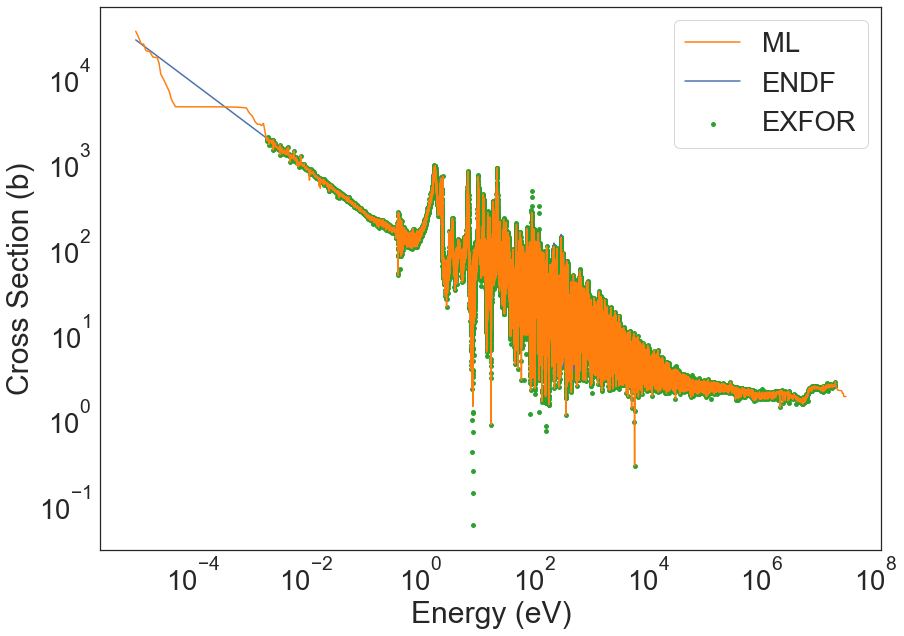

In [205]:
u_b0 = exfor_utils.predicting_nuclear_xs_v2(
    df_b0, 92, 233, 18, b0_train_model, to_scale_b0, b0_train_scaler, show=True, save=True, 
    path="Figures/KNN/B0_u233_fission.png", get_endf=True, log=True, save_both=True,
    plotter="plt", order_dict=order_dict)

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/U233/endfb8.0/tables/xs/n-U233-MT018.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 15345 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (94567, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (94567, 43)


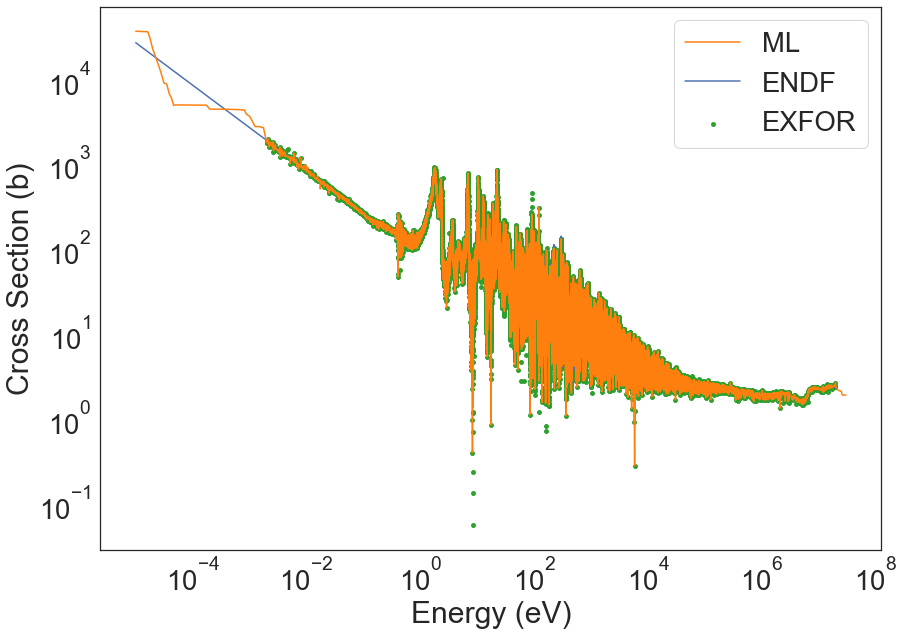

In [206]:
u_b1 = exfor_utils.predicting_nuclear_xs_v2(
    df_b1, 92, 233, 18, b1_train_model, to_scale_b1, b1_train_scaler, show=True, save=True, 
    path="Figures/KNN/B1_u233_fission.png", get_endf=True, log=True, save_both=True,
    plotter="plt", order_dict=order_dict)

## Loading Newly Measured Chlorine (n,p) Unseen Data 

These data points are not in the current EXFOR data package and will be used to test the new modeling capabilities.

In [209]:
new_cl_data_kwargs = {"Z":17, "A":35, "MT":103, "log":True, "scale":True, "scaler":knn_train_scaler, "to_scale":to_scale, "one_hot":True}
new_cl_data = exfor_utils.load_newdata("../EXFOR/New_Data/Chlorine_Data/new_cl_np.csv", df_b1, **new_cl_data_kwargs)
new_cl_data.head()

INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (12, 43)


,Energy,Data,Z,N,A,Atomic_Mass_Micro,Nucleus_Radius,Neutron_Nucleus_Radius_Ratio,MT_1,MT_101,...,MT_33,MT_4,MT_41,MT_51,MT_9000,MT_9001,Center_of_Mass_Flag_Center_of_Mass,Center_of_Mass_Flag_Lab,Element_Flag_I,Element_Flag_N
0,6.383815,-1.779892,-1.129089,-1.113723,-1.12,3.496885e+07,4.088833,0.195655,0,0,...,0,0,0,0,0,0,0,1,1,0
1,6.383815,-1.707744,-1.129089,-1.113723,-1.12,3.496885e+07,4.088833,0.195655,0,0,...,0,0,0,0,0,0,0,1,1,0
2,6.401401,-1.583359,-1.129089,-1.113723,-1.12,3.496885e+07,4.088833,0.195655,0,0,...,0,0,0,0,0,0,0,1,1,0
3,6.401401,-1.590067,-1.129089,-1.113723,-1.12,3.496885e+07,4.088833,0.195655,0,0,...,0,0,0,0,0,0,0,1,1,0
4,6.411620,-1.350665,-1.129089,-1.113723,-1.12,3.496885e+07,4.088833,0.195655,0,0,...,0,0,0,0,0,0,0,1,1,0


In [213]:
new_cl = exfor_utils.predicting_nuclear_xs_v2(
    df_b1, 17, 35, 103, b1_train_model, to_scale_b1, b1_train_scaler, show=True, save=False, 
    path="Figures/KNN/B1_chlorine_35_np_new.png", get_endf=True, 
    log=True, new_data=new_cl_data, save_both=True)

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)


In [49]:
b0_train_model, b0_train_scaler = model_utils.load_model_and_scaler(best_b0.iloc[[1]])

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/U233/endfb8.0/tables/xs/n-U233-MT002.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 5590 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (261, 40)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (261, 40)


           Energy   Z    N    A
3120655 -1.596879  92  141  233
3120656 -0.568636  92  141  233
3120657 -0.455932  92  141  233
3120658 -0.346787  92  141  233
3120659 -0.259637  92  141  233
(261, 4)


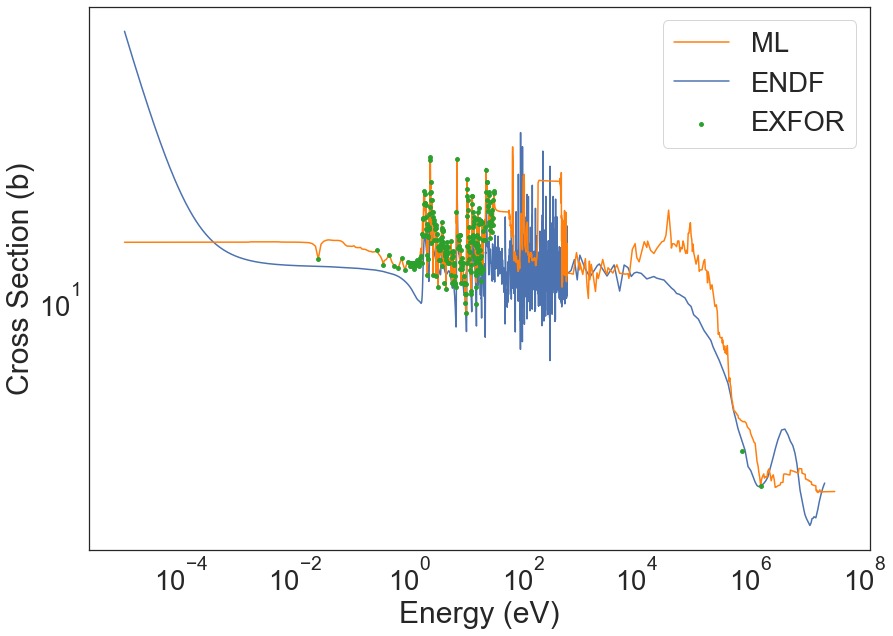

In [54]:
u_b1 = exfor_utils.predicting_nuclear_xs_v2(
    df_b0, 92, 233, 2, b0_train_model, ["Energy"] + to_scale_b0, b0_train_scaler, show=True, save=True, 
    path="../Figures/KNN/B0_u233_elastic.png", get_endf=True, log=True, save_both=True, inv_trans=True,
    plotter="plt")